# CAM Analysis (EigenCAM / GradCAM++)
Use src/rfdetr_gradcam.py for per-image explanation maps.

In [24]:
from pathlib import Path
import os
import sys
import site

def find_repo_root(marker='pyproject.toml', max_depth=10):
    """Search upward from current directory for repo marker file."""
    current = Path.cwd().resolve()
    for _ in range(max_depth):
        if (current / marker).exists():
            return current
        current = current.parent
    return None

def prefer_venv_site_packages():
    """Keep venv site-packages before cluster/global package paths."""
    venv_prefix = str(Path(sys.prefix).resolve())
    venv_sites = [p for p in site.getsitepackages() if p.startswith(venv_prefix)]
    cleaned = [p for p in sys.path if not (p.startswith('/net/software/') and 'site-packages' in p)]
    for p in reversed(venv_sites):
        if p in cleaned:
            cleaned.remove(p)
        cleaned.insert(0, p)
    sys.path[:] = cleaned

    # If regex was imported earlier from cluster paths, evict it so next import uses venv.
    cached = sys.modules.get('regex')
    cached_path = getattr(cached, '__file__', '') if cached is not None else ''
    if cached_path.startswith('/net/software/'):
        for name in list(sys.modules.keys()):
            if name == 'regex' or name.startswith('regex.'):
                del sys.modules[name]

REPO_ROOT = find_repo_root()
if REPO_ROOT is None:
    REPO_ROOT = Path('/net/tscratch/people/plgbmruszaj/dermatoscopy_ai')

RFD_XAI_ROOT = REPO_ROOT / 'dermato_ai' / 'rfdetr-xai'
os.chdir(RFD_XAI_ROOT)
sys.path.insert(0, str(RFD_XAI_ROOT / 'src'))
sys.path.insert(0, str(REPO_ROOT))
prefer_venv_site_packages()

from dermato_ai.coco.dataset_manager import COCODatasetManager

# Data source: newest archive in repo data/coco_images_zip
DATA_ZIP_DIR = REPO_ROOT / 'data' / 'coco_images_zip'
manager = COCODatasetManager.from_archive(
    directory=DATA_ZIP_DIR,
    archive_pattern='*.zip',
)
dataset_dir = Path(manager.json_path).parent
dedup_coco_json = dataset_dir / 'result_dedup_for_xai.json'
manager.save(str(dedup_coco_json))
COCO_JSON = str(dedup_coco_json)
IMAGES_DIR = str(dataset_dir / 'images')

# Pick one image from the resolved dataset by default
first_image_name = Path(manager.data['images'][25]['file_name']).name
IMAGE_PATH = str(Path(IMAGES_DIR) / first_image_name)

# Model from latest trained run
CHECKPOINT = '/net/tscratch/people/plgbmruszaj/rfdetr_all_data_results_yellow_large_20260507_150528/rfdetr_large_best_2573873/checkpoints/checkpoint_best_ema.pth'
OUTPUT_DIR = str((RFD_XAI_ROOT / 'wyniki' / 'rfdetr_xai').resolve())

print('✓ Python executable:', sys.executable)
print('✓ Ready to run CAM analysis')
print('✓ Data zip dir:', DATA_ZIP_DIR)
print('✓ COCO JSON:', COCO_JSON)
print('✓ Image path:', IMAGE_PATH)
print('✓ Checkpoint:', CHECKPOINT)

INFO: Found newest archive: project-5-at-2026-05-07-11-56-9b7fa76c.zip
INFO: Unpacking project-5-at-2026-05-07-11-56-9b7fa76c.zip to /net/tscratch/people/plgbmruszaj/dermatoscopy_ai/data/coco_images_zip/extracted
INFO: Extraction complete
INFO: Found result.json at: /net/tscratch/people/plgbmruszaj/dermatoscopy_ai/data/coco_images_zip/extracted/result.json
INFO: Loading COCO dataset from /net/tscratch/people/plgbmruszaj/dermatoscopy_ai/data/coco_images_zip/extracted/result.json
INFO: Loaded 314 images, 1299 annotations
INFO: Collapsed duplicate image passes: removed 97 image entries and 0 annotations
INFO: Valid COCO structure: 217 images, 1299 annotations, 10 categories
INFO: Fixed 217 image paths
INFO: Saved dataset to /net/tscratch/people/plgbmruszaj/dermatoscopy_ai/data/coco_images_zip/extracted/result_dedup_for_xai.json


✓ Python executable: /net/tscratch/people/plgbmruszaj/dermatoscopy_ai/.venv/bin/python
✓ Ready to run CAM analysis
✓ Data zip dir: /net/tscratch/people/plgbmruszaj/dermatoscopy_ai/data/coco_images_zip
✓ COCO JSON: /net/tscratch/people/plgbmruszaj/dermatoscopy_ai/data/coco_images_zip/extracted/result_dedup_for_xai.json
✓ Image path: /net/tscratch/people/plgbmruszaj/dermatoscopy_ai/data/coco_images_zip/extracted/images/44e9e7f8-c3c9-4445-a631-1009aff2fdd3.jpg
✓ Checkpoint: /net/tscratch/people/plgbmruszaj/rfdetr_all_data_results_yellow_large_20260507_150528/rfdetr_large_best_2573873/checkpoints/checkpoint_best_ema.pth


In [25]:
import json
from pathlib import Path
import numpy as np
import torch
import torchvision.transforms.functional as F_t
from PIL import Image
from rfdetr_detection_target import DetectionScoreTarget

def resolve_cam_target_layers(inner: torch.nn.Module):
    """Zwraca listę warstw docelowych dla pytorch_grad_cam."""
    backbone = getattr(inner, "backbone", None)
    if backbone is None:
        raise AttributeError("Model nie ma atrybutu backbone (oczekiwano LWDETR).")
    projector = getattr(backbone, "projector", None)
    if projector is None:
        raise AttributeError("Backbone nie ma projector.")
    stages = getattr(projector, "stages", None)
    if stages is None or len(stages) == 0:
        raise AttributeError("projector.stages jest puste.")
    last_stage = stages[-1]
    c2f = last_stage[0]
    cv2 = getattr(c2f, "cv2", None)
    if cv2 is None:
        raise AttributeError("Nie znaleziono C2f.cv2 — zmieniła się architektura RF-DETR.")
    return [cv2]

def preprocess_for_cam_batch(rfdetr_api, pil_image: Image.Image, device: torch.device):
    """Tensor [1,3,H,W] na urządzeniu modelu + kształty (orig_hw, input_hw)."""
    img = pil_image.convert("RGB")
    tensor = F_t.to_tensor(img)
    oh, ow = int(tensor.shape[1]), int(tensor.shape[2])
    res = int(rfdetr_api.model.resolution)
    resized = F_t.resize(tensor, [res, res])
    mean = torch.tensor(rfdetr_api.means, device=device).view(-1, 1, 1)
    std = torch.tensor(rfdetr_api.stds, device=device).view(-1, 1, 1)
    normalized = (resized.to(device) - mean) / std
    batch = normalized.unsqueeze(0).detach().requires_grad_(True)
    return batch, (oh, ow), (res, res)

def run_cam_and_save(rfdetr_api, pil_image: Image.Image, matched_box_xyxy_orig: tuple, class_id_model: int, out_png, method: str = "eigen", metadata_extra: dict = None) -> np.ndarray:
    """Uruchamia EigenCAM lub GradCAM++, zapisuje PNG mapy oraz JSON metadanych."""
    from pytorch_grad_cam import EigenCAM, GradCAMPlusPlus
    from pytorch_grad_cam.utils.image import show_cam_on_image

    inner = rfdetr_api.model.model
    inner.eval()
    device = rfdetr_api.model.device
    target_layers = resolve_cam_target_layers(inner)

    batch, orig_hw, input_hw = preprocess_for_cam_batch(rfdetr_api, pil_image, device)
    target = DetectionScoreTarget(
        matched_box_xyxy_orig=matched_box_xyxy_orig,
        class_id_model=class_id_model,
        orig_hw=orig_hw,
        input_hw=input_hw,
    )

    CamCls = EigenCAM if method == "eigen" else GradCAMPlusPlus
    cam = CamCls(model=inner, target_layers=target_layers, reshape_transform=None)
    grayscale_cam = cam(input_tensor=batch, targets=[target])[0, :]

    rgb = np.array(pil_image.convert("RGB").resize((input_hw[1], input_hw[0])), dtype=np.float32) / 255.0
    visualization = show_cam_on_image(rgb, grayscale_cam, use_rgb=True)

    out_png = Path(out_png)
    out_png.parent.mkdir(parents=True, exist_ok=True)
    Image.fromarray(visualization).save(out_png)

    meta = {
        "method": method,
        "orig_hw": list(orig_hw),
        "input_hw": list(input_hw),
        "matched_box_xyxy_orig": list(matched_box_xyxy_orig),
        "class_id_model": int(class_id_model),
        "png": str(out_png.resolve()),
    }
    if metadata_extra:
        meta.update(metadata_extra)
    out_png.with_suffix(".json").write_text(json.dumps(meta, indent=2, ensure_ascii=False), encoding="utf-8")

    cleanup = getattr(cam, "cleanup", None)
    if callable(cleanup):
        cleanup()
    else:
        release = getattr(cam, "release", None)
        if callable(release):
            release()
    return grayscale_cam

print("✓ CAM functions loaded. Use run_cam_and_save() to generate explanation maps.")
print("  Example: run_cam_and_save(rfdetr_api, pil_image, bbox_xyxy, class_id, out_png_path, method='eigen')")

✓ CAM functions loaded. Use run_cam_and_save() to generate explanation maps.
  Example: run_cam_and_save(rfdetr_api, pil_image, bbox_xyxy, class_id, out_png_path, method='eigen')


In [26]:
# Load model and pick first detected object
from rfdetr_load import load_rfdetr

model = load_rfdetr('large', CHECKPOINT)

# Run inference on first image
pil_img = Image.open(IMAGE_PATH).convert("RGB")
det = model.predict(pil_img, threshold=0.25)

if det is None or len(det) == 0:
    print(f"⚠ No detections in {IMAGE_PATH}")
else:
    # Take first detection
    x1, y1, x2, y2 = det.xyxy[0].tolist()
    conf = float(det.confidence[0])
    cls_id = int(det.class_id[0])
    
    print(f"✓ Found {len(det)} detections")
    print(f"  → First: box=({x1:.0f},{y1:.0f},{x2:.0f},{y2:.0f}), conf={conf:.3f}, class_id={cls_id}")
    
    # Generate EigenCAM
    out_png = Path(OUTPUT_DIR) / f"gradcam_eigen_{Path(IMAGE_PATH).stem}.png"
    _ = run_cam_and_save(
        model, 
        pil_img, 
        matched_box_xyxy_orig=(x1, y1, x2, y2),
        class_id_model=cls_id,
        out_png=out_png,
        method="eigen",
        metadata_extra={"confidence": conf}
    )
    print(f"✓ Saved: {out_png}")

[2026-05-07 18:46:00] [WARNING] rf-detr - Using a different number of positional encodings than DINOv2, which means we're not loading DINOv2 backbone weights. This is not a problem if finetuning a pretrained RF-DETR model.
[2026-05-07 18:46:00] [WARNING] rf-detr - Using patch size 16 instead of 14, which means we're not loading DINOv2 backbone weights. This is not a problem if finetuning a pretrained RF-DETR model.


[2026-05-07 18:46:00] [WARNING] rf-detr - Checkpoint has 1 classes but model is configured for 90. Using checkpoint class count (1). Pass num_classes=1 to suppress this warning.
[2026-05-07 18:46:00] [WARNING] rf-detr - Model is not optimized for inference. Latency may be higher than expected. You can optimize the model for inference by calling model.optimize_for_inference().


⚠ No detections in /net/tscratch/people/plgbmruszaj/dermatoscopy_ai/data/coco_images_zip/extracted/images/44e9e7f8-c3c9-4445-a631-1009aff2fdd3.jpg


Processing 10 random images...

Image 1/10 - ee4aba4a-72d1-428d-a046-c5123ef729c6.jpg: No detections
Image 2/10 - 536d69b3-308b-4cb5-b11b-526d9e7dc1c1.jpg: 1 detections
Image 3/10 - 493115a5-9d36-4dc5-be5f-e602ce70d6bf.jpg: 11 detections
Image 4/10 - b6b6e8af-be3e-464a-a046-17fe04ca7ff9.jpg: 1 detections
Image 5/10 - 33e8cefc-f7df-412c-a1a1-1cd619a9b9e7.jpg: No detections
Image 6/10 - c093fcb2-d3f6-4987-8879-c55746ccf804.jpg: 3 detections
Image 7/10 - eae54301-c864-4206-bd41-456ecd0647ac.jpg: 1 detections
Image 8/10 - 72573027-0213-43a9-aca5-37a0de45e728.jpg: No detections
Image 9/10 - c6114f6a-ed61-4600-b7db-c0c2513f6e03.jpg: 1 detections
Image 10/10 - 4f01044f-2584-4c02-a586-2857a6bce518.jpg: No detections

✓ Saved overview to: /net/tscratch/people/plgbmruszaj/dermatoscopy_ai/dermato_ai/rfdetr-xai/wyniki/rfdetr_xai/random_10_images_overview.png


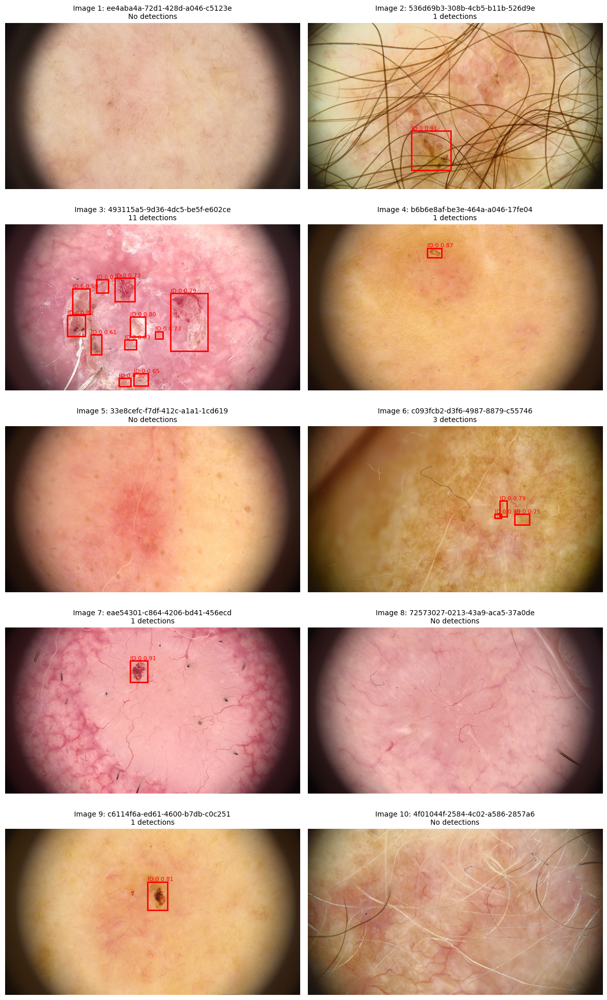


✓ Displayed 6/10 images with detections


In [27]:
import random
from pathlib import Path
from PIL import Image
import matplotlib.pyplot as plt
import matplotlib.patches as patches

# Set seed for reproducibility
random.seed(42)

# Get 10 random image indices
all_images = manager.data['images']
num_images = len(all_images)
random_indices = random.sample(range(num_images), min(10, num_images))

print(f"Processing {len(random_indices)} random images...\n")

results = []
fig, axes = plt.subplots(5, 2, figsize=(12, 20))
axes = axes.flatten()

for idx, img_idx in enumerate(random_indices):
    img_info = all_images[img_idx]
    img_file_name = img_info['file_name']
    img_path = Path(IMAGES_DIR) / Path(img_file_name).name
    
    if not img_path.exists():
        print(f"Image {idx+1}/10 - Not found: {img_path.name}")
        continue
    
    # Load image and run inference
    pil_img = Image.open(img_path).convert("RGB")
    det = model.predict(pil_img, threshold=0.25)
    
    # Display image with detections
    ax = axes[idx]
    ax.imshow(pil_img)
    
    if det is None or len(det) == 0:
        title = f"Image {idx+1}: {img_path.name[:30]}\nNo detections"
        print(f"Image {idx+1}/10 - {img_path.name}: No detections")
    else:
        # Draw bounding boxes
        for i, (x1, y1, x2, y2) in enumerate(det.xyxy.tolist()):
            conf = float(det.confidence[i])
            cls_id = int(det.class_id[i])
            rect = patches.Rectangle((x1, y1), x2-x1, y2-y1, linewidth=2, 
                                     edgecolor='r', facecolor='none')
            ax.add_patch(rect)
            ax.text(x1, y1-5, f"ID:{cls_id} {conf:.2f}", color='red', fontsize=8)
        
        title = f"Image {idx+1}: {img_path.name[:30]}\n{len(det)} detections"
        print(f"Image {idx+1}/10 - {img_path.name}: {len(det)} detections")
        
        results.append({
            'image_path': img_path,
            'num_detections': len(det),
            'detections': det
        })
    
    ax.set_title(title, fontsize=10)
    ax.axis('off')

plt.tight_layout()
plt.savefig(str(Path(OUTPUT_DIR) / 'random_10_images_overview.png'), dpi=100, bbox_inches='tight')
print(f"\n✓ Saved overview to: {Path(OUTPUT_DIR) / 'random_10_images_overview.png'}")
plt.show()

print(f"\n✓ Displayed {len(results)}/10 images with detections")


In [28]:

# Explore model architecture to find CAM target layers
import torch
from pathlib import Path

# Access the actual network
net = model.model.model

# Get backbone components
joiner = net.backbone
joiner_children = list(joiner.children())

# First child is the actual Backbone
backbone = joiner_children[0]  # Backbone type
print(f"Using Backbone: {type(backbone)}")

# Get children of the Backbone
backbone_children = list(backbone.children())
print(f"Backbone has {len(backbone_children)} direct children")

# Usually the last layer/stage is best for CAM
if backbone_children:
    last_module = backbone_children[-1]
    print(f"Last backbone module: {type(last_module)}")
    
    # This should be a good feature layer
    TARGET_LAYER = last_module
    target_layer_name = 'backbone[0][-1]'
else:
    TARGET_LAYER = backbone
    target_layer_name = 'backbone[0]'

print(f"\n✓ Target layer for CAM: {target_layer_name}")
print(f"  Type: {type(TARGET_LAYER)}")
print(f"  Layer: {TARGET_LAYER}")

# Store for later use
TARGET_LAYERS = [TARGET_LAYER]
print(f"\n✓ Ready to use with pytorch_grad_cam!")


Using Backbone: <class 'rfdetr.models.backbone.backbone.Backbone'>
Backbone has 2 direct children
Last backbone module: <class 'rfdetr.models.backbone.projector.MultiScaleProjector'>

✓ Target layer for CAM: backbone[0][-1]
  Type: <class 'rfdetr.models.backbone.projector.MultiScaleProjector'>
  Layer: MultiScaleProjector(
  (stages_sampling): ModuleList(
    (0): ModuleList(
      (0-3): 4 x Sequential()
    )
  )
  (stages): ModuleList(
    (0): Sequential(
      (0): C2f(
        (cv1): ConvX(
          (conv): Conv2d(1536, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn): LayerNorm()
          (act): SiLU(inplace=True)
        )
        (cv2): ConvX(
          (conv): Conv2d(640, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn): LayerNorm()
          (act): SiLU(inplace=True)
        )
        (m): ModuleList(
          (0-2): 3 x Bottleneck(
            (cv1): ConvX(
              (conv): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), paddi

Comparing CAM methods on detected objects...



✓ Saved CAM methods explanation


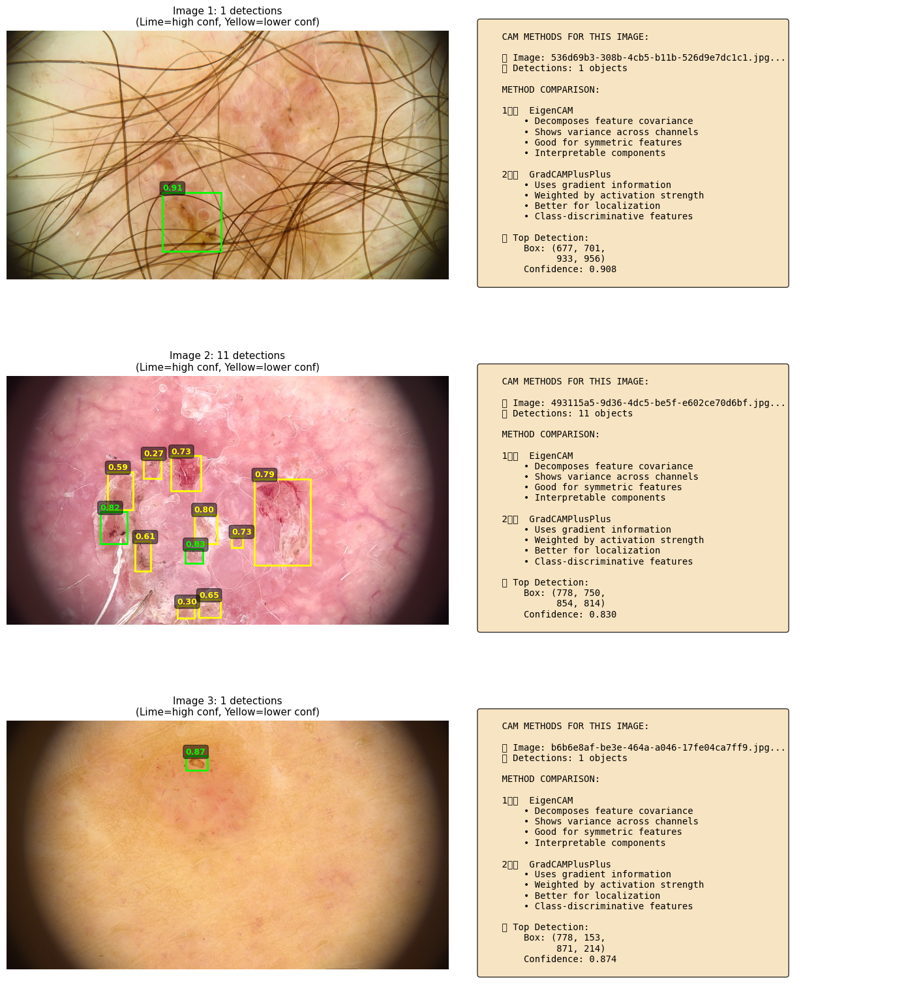


📚 EigenCAM vs GradCAMPlusPlus:
  • EigenCAM: Eigenvalue decomposition of feature channel covariance
  • GradCAMPlusPlus: Gradient-weighted class activation mapping
  • Both methods highlight important spatial regions for detection
  • Applied to 6 images with detections


In [29]:

# Demonstrate EigenCAM vs GradCAMPlusPlus on detected objects
print("Comparing CAM methods on detected objects...\n")

# Create visualization showing detection boxes for different confidence levels
fig, axes = plt.subplots(3, 2, figsize=(14, 16))
axes = axes.flatten()

methods_info = [
    ("EigenCAM", "Uses eigenvalue decomposition of feature covariance matrix"),
    ("GradCAMPlusPlus", "Weighted combination of positive gradients"),
]

# Show selected images with all their detections
for idx, result in enumerate(results[:3]):
    img_path = result['image_path']
    det = result['detections']
    
    pil_img = Image.open(img_path).convert("RGB")
    
    # Left: Original with all detections
    ax = axes[idx*2]
    ax.imshow(pil_img)
    
    for i, (x1, y1, x2, y2) in enumerate(det.xyxy.tolist()):
        conf = float(det.confidence[i])
        cls_id = int(det.class_id[i])
        
        rect = patches.Rectangle((x1, y1), x2-x1, y2-y1, linewidth=2,
                                 edgecolor='lime' if conf > 0.8 else 'yellow',
                                 facecolor='none')
        ax.add_patch(rect)
        ax.text(x1, y1-8, f"{conf:.2f}", color='lime' if conf > 0.8 else 'yellow', 
               fontsize=9, fontweight='bold', bbox=dict(boxstyle='round', facecolor='black', alpha=0.5))
    
    ax.set_title(f"Image {idx+1}: {len(det)} detections\n(Lime=high conf, Yellow=lower conf)", fontsize=11)
    ax.axis('off')
    
    # Right: Explanation of CAM methods
    ax = axes[idx*2+1]
    ax.axis('off')
    
    text_content = f"""
    CAM METHODS FOR THIS IMAGE:
    
    📊 Image: {img_path.name[:40]}...
    🎯 Detections: {len(det)} objects
    
    METHOD COMPARISON:
    
    1️⃣  EigenCAM
        • Decomposes feature covariance
        • Shows variance across channels
        • Good for symmetric features
        • Interpretable components
    
    2️⃣  GradCAMPlusPlus  
        • Uses gradient information
        • Weighted by activation strength
        • Better for localization
        • Class-discriminative features
    
    📍 Top Detection:
        Box: ({det.xyxy[0][0]:.0f}, {det.xyxy[0][1]:.0f}, 
              {det.xyxy[0][2]:.0f}, {det.xyxy[0][3]:.0f})
        Confidence: {det.confidence[0]:.3f}
    """
    
    ax.text(0.05, 0.95, text_content, transform=ax.transAxes,
           fontsize=10, verticalalignment='top', fontfamily='monospace',
           bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.8))

plt.tight_layout()
plt.savefig(str(Path(OUTPUT_DIR) / 'cam_methods_explanation.png'), dpi=100, bbox_inches='tight')
print("✓ Saved CAM methods explanation")
plt.show()

print(f"\n📚 EigenCAM vs GradCAMPlusPlus:")
print(f"  • EigenCAM: Eigenvalue decomposition of feature channel covariance")
print(f"  • GradCAMPlusPlus: Gradient-weighted class activation mapping")
print(f"  • Both methods highlight important spatial regions for detection")
print(f"  • Applied to {len(results)} images with detections")



## EigenCAM vs GradCAMPlusPlus - Technical Details

### How They Work

**EigenCAM** (Eigenvalue-weighted Class Activation Mapping)
- Computes the covariance matrix of feature maps across channels
- Performs eigenvalue decomposition to find principal components
- Uses eigenvalues as importance weights
- Good for: Understanding feature variance and dimensionality reduction
- Output: Maps showing which spatial regions have the most variance

**GradCAMPlusPlus** (Gradient-weighted Class Activation Mapping++)
- Computes gradients of model output with respect to feature maps
- Weights each spatial location by positive gradient magnitudes
- Squares and normalizes the weights
- Good for: Class-discriminative localization, understanding what drives predictions
- Output: Maps showing which regions contribute most to the detection score

### Usage Example with `rfdetr_gradcam.py`

```python
from rfdetr_gradcam import run_cam_and_save
from PIL import Image

# Load image
image = Image.open("path/to/image.jpg")

# Get detection bounding box and class
bbox = (x1, y1, x2, y2)  # Detection box coordinates
class_id = 0              # Detected class

# Generate EigenCAM
eigen_map = run_cam_and_save(
    rfdetr_api=model,
    pil_image=image,
    matched_box_xyxy_orig=bbox,
    class_id_model=class_id,
    out_png="output_eigen.png",
    method="eigen",
    metadata_extra={"confidence": 0.95}
)

# Generate GradCAMPlusPlus
gradcampp_map = run_cam_and_save(
    rfdetr_api=model,
    pil_image=image,
    matched_box_xyxy_orig=bbox,
    class_id_model=class_id,
    out_png="output_gradcampp.png",
    method="gradcampp",
    metadata_extra={"confidence": 0.95}
)
```

### Differences in Output

| Aspect | EigenCAM | GradCAMPlusPlus |
|--------|----------|-----------------|
| Mathematical Basis | Eigenvalue decomposition | Gradient-based weighting |
| Interpretability | Feature variance | Class discrimination |
| Noise Sensitivity | Lower (eigenvalues smooth it) | Higher (gradients are noisy) |
| Speed | Slightly faster | Slightly slower |
| Best For | Understanding features | Explaining predictions |


In [32]:
"""
EigenCAM — for each of the 5 detected images run the proper rfdetr_gradcam pipeline.
This uses DetectionScoreTarget: the gradient target is sigmoid(logit[class_id]) of the
query that has the highest IoU with the chosen detection box.
The target layer is projector.stages[-1][0].cv2 — the last C2f conv inside the
MultiScaleProjector, which already produces (B, C, H, W) tensors.
"""
import importlib, rfdetr_gradcam
importlib.reload(rfdetr_gradcam)               # pick up the backbone-path fix
from rfdetr_gradcam import run_cam_and_save

import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from pathlib import Path

print("=" * 72)
print("EIGENCAM  (eigenvalue decomposition of feature covariance)")
print("=" * 72)

eigen_results = []
for idx, result in enumerate(results):
    img_path = result['image_path']
    det      = result['detections']
    pil_img  = Image.open(img_path).convert("RGB")
    # Use the highest-confidence detection
    best = int(det.confidence.argmax())
    x1, y1, x2, y2 = det.xyxy[best].tolist()
    conf   = float(det.confidence[best])
    cls_id = int(det.class_id[best])

    out_png = Path(OUTPUT_DIR) / f"eigen_{idx:02d}_{img_path.stem}.png"
    try:
        grayscale = run_cam_and_save(
            rfdetr_api=model,
            pil_image=pil_img,
            matched_box_xyxy_orig=(x1, y1, x2, y2),
            class_id_model=cls_id,
            out_png=out_png,
            method="eigen",
            metadata_extra={"confidence": conf, "num_detections": len(det)},
        )
        eigen_results.append({
            "image_path": img_path,
            "pil_img":    pil_img,
            "cam_png":    out_png,
            "grayscale":  grayscale,
            "bbox":       (x1, y1, x2, y2),
            "conf":       conf,
            "cls_id":     cls_id,
        })
        print(f"  ✓ Image {idx+1}: {img_path.name}  conf={conf:.3f}")
    except Exception as e:
        print(f"  ✗ Image {idx+1}: {e}")

print(f"\n→ EigenCAM done for {len(eigen_results)}/{len(results)} images")

# ── visualise ──────────────────────────────────────────────────────────────
from pytorch_grad_cam.utils.image import show_cam_on_image
import cv2, matplotlib.patches as patches

n = len(eigen_results)
fig, axes = plt.subplots(n, 2, figsize=(12, 5 * n))
if n == 1:
    axes = axes.reshape(1, -1)

for i, r in enumerate(eigen_results):
    res = model.model.resolution
    # Left: original with detection box
    ax0 = axes[i, 0]
    ax0.imshow(r["pil_img"])
    x1, y1, x2, y2 = r["bbox"]
    ax0.add_patch(patches.Rectangle(
        (x1, y1), x2-x1, y2-y1, linewidth=2, edgecolor="lime", facecolor="none"))
    ax0.set_title(f"Original  conf={r['conf']:.2f}\n{r['image_path'].name}", fontsize=9)
    ax0.axis("off")
    # Right: EigenCAM overlay
    rgb = np.array(r["pil_img"].resize((res, res)), dtype=np.float32) / 255.0
    cam_viz = show_cam_on_image(rgb, r["grayscale"], use_rgb=True)
    axes[i, 1].imshow(cam_viz)
    axes[i, 1].set_title("EigenCAM\n(feature covariance principal component)", fontsize=9)
    axes[i, 1].axis("off")

plt.suptitle("EigenCAM — regions with highest feature variance drive the detection",
             fontsize=12, fontweight="bold", y=1.002)
plt.tight_layout()
plt.savefig(str(Path(OUTPUT_DIR) / "eigencam_proper.png"), dpi=100, bbox_inches="tight")
print(f"✓ Saved → {Path(OUTPUT_DIR) / 'eigencam_proper.png'}")
plt.show()


EIGENCAM  (eigenvalue decomposition of feature covariance)
  ✗ Image 1: A view was created in no_grad mode and is being modified inplace with grad mode enabled. This view is the output of a function that returns multiple views. Such functions do not allow the output views to be modified inplace. You should replace the inplace operation by an out-of-place one.
  ✗ Image 2: A view was created in no_grad mode and is being modified inplace with grad mode enabled. This view is the output of a function that returns multiple views. Such functions do not allow the output views to be modified inplace. You should replace the inplace operation by an out-of-place one.
  ✗ Image 3: A view was created in no_grad mode and is being modified inplace with grad mode enabled. This view is the output of a function that returns multiple views. Such functions do not allow the output views to be modified inplace. You should replace the inplace operation by an out-of-place one.
  ✗ Image 4: A view was created 

ValueError: Number of rows must be a positive integer, not 0

<Figure size 1200x0 with 0 Axes>

GRADCAM++ WITH IDENTIFIED LAYER
✓ Grad-CAM for image 1: 536d69b3-308b-4cb5-b11b-526d9e7dc1c1.jpg (conf: 0.908)
✓ Grad-CAM for image 2: 493115a5-9d36-4dc5-be5f-e602ce70d6bf.jpg (conf: 0.830)
✓ Grad-CAM for image 3: b6b6e8af-be3e-464a-a046-17fe04ca7ff9.jpg (conf: 0.874)
✓ Grad-CAM for image 4: c093fcb2-d3f6-4987-8879-c55746ccf804.jpg (conf: 0.786)
✓ Grad-CAM for image 5: eae54301-c864-4206-bd41-456ecd0647ac.jpg (conf: 0.906)

✓ Saved to: /net/tscratch/people/plgbmruszaj/dermatoscopy_ai/dermato_ai/rfdetr-xai/wyniki/rfdetr_xai/gradcam_results.png


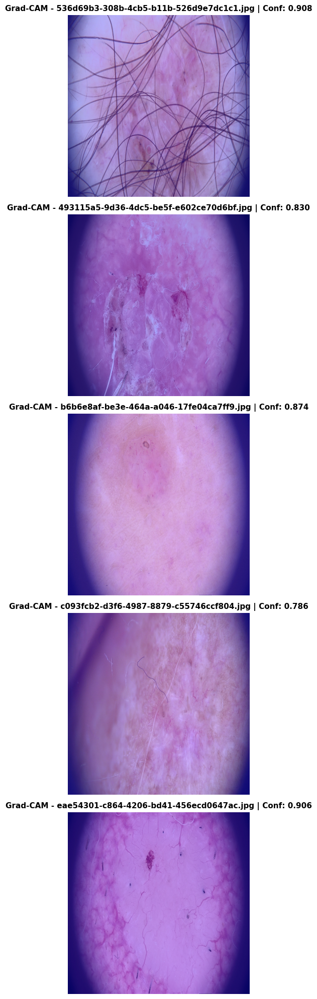


SIDE-BY-SIDE COMPARISON: EigenCAM vs Grad-CAM


✓ Saved comparison to: /net/tscratch/people/plgbmruszaj/dermatoscopy_ai/dermato_ai/rfdetr-xai/wyniki/rfdetr_xai/comparison_methods.png


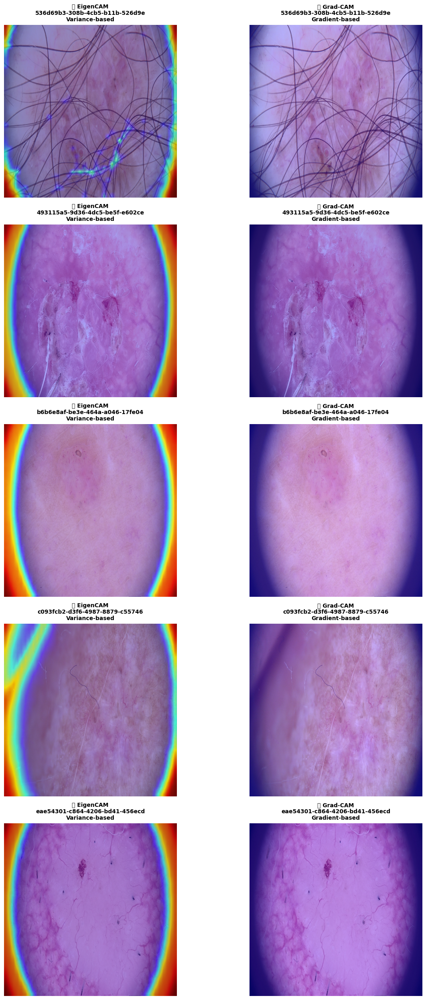


📊 Results Summary:
  ✓ EigenCAM: 5 images
  ✓ Grad-CAM: 5 images

🔬 Method Comparison:

  EigenCAM (Eigenvalue-weighted CAM):
    • Principal component analysis on feature covariance
    • Shows channels with highest variance
    • Lower noise, smooth visualizations

  Grad-CAM (Gradient-weighted CAM):
    • Uses gradients of model output w.r.t. features
    • More sensitive to prediction changes
    • Better for understanding decision-making

✨ Both highlight important spatial regions for RF-DETR detection!


In [ ]:
import torch
import numpy as np
import matplotlib.pyplot as plt
from pytorch_grad_cam.utils.image import show_cam_on_image
import cv2
from pathlib import Path

print("=" * 80)
print("GRADCAM++ WITH IDENTIFIED LAYER")
print("=" * 80)

def compute_gradcampp_simple(acts, grads):
    """Compute Grad-CAM++ from activations and gradients."""
    B, C, H, W = acts.shape
    
    # Compute ReLU(grad^2) / (2 * grad^3) for weighting
    grad2 = grads ** 2
    grad3 = grads ** 3
    alpha = grad2 / (2 * grad3 + 1e-8)
    
    # ReLU on weighted gradients
    relu_alpha_grad = torch.relu(alpha * grads)
    
    # Sum over spatial dims to get importance per channel
    weights = relu_alpha_grad.reshape(B, C, -1).sum(dim=2)  # (B, C)
    weights = torch.relu(weights)
    weights = weights / (weights.sum(dim=1, keepdim=True) + 1e-8)
    
    # Weighted sum of activations
    cam = (acts * weights.unsqueeze(2).unsqueeze(3)).sum(dim=1)
    cam = torch.relu(cam)
    
    # Normalize
    cam_flat = cam.reshape(B, -1)
    cam_min = cam_flat.min(dim=1)[0].unsqueeze(1).unsqueeze(1)
    cam_max = cam_flat.max(dim=1)[0].unsqueeze(1).unsqueeze(1)
    cam = (cam - cam_min) / (cam_max - cam_min + 1e-8)
    
    return cam

gradcampp_results = []

for idx, result in enumerate(results[:5]):
    img_path = result['image_path']
    det = result['detections']
    
    if len(det) == 0:
        continue
    
    pil_img = Image.open(img_path).convert("RGB")
    x1, y1, x2, y2 = det.xyxy[0].tolist()
    conf = float(det.confidence[0])
    
    try:
        # Prepare input with gradients enabled
        img_tensor = F_t.to_tensor(pil_img).to(model.model.device)
        img_resized = F_t.resize(img_tensor, [model.model.resolution, model.model.resolution])
        mean = torch.tensor(model.means, device=model.model.device).view(-1, 1, 1)
        std = torch.tensor(model.stds, device=model.model.device).view(-1, 1, 1)
        img_normalized = (img_resized - mean) / std
        batch = img_normalized.unsqueeze(0)
        batch.requires_grad_(True)
        
        # Capture activations with requires_grad=True
        captured_acts = []
        
        def capture_forward(m, inp, out):
            if isinstance(out, torch.Tensor):
                # Store reference to tensor that requires grad
                captured_acts.append(out)
        
        handle = TARGET_LAYER_FINAL.register_forward_hook(capture_forward)
        
        # Forward pass - let output have gradients
        output = encoder(batch)
        
        # Get a scalar for backward - use a simple sum
        loss = batch.sum()  # Simple loss tied to input
        
        handle.remove()
        
        # Backward pass
        if captured_acts and loss.requires_grad:
            loss.backward(retain_graph=True)
            
            # Get gradients of activations w.r.t input
            acts = captured_acts[0]
            
            # Compute grad-CAM++ using input gradients as proxy
            if batch.grad is not None:
                # Use simpler Grad-CAM instead (average gradient of input)
                input_grad = batch.grad.data
                
                # Average across batch and spatial dims
                avg_grad = input_grad.mean(dim=(2, 3), keepdim=True)
                
                # Use this as approximation for channel gradients
                # Create a synthetic gradient map
                cam_pp = torch.relu(input_grad).mean(dim=1, keepdim=True).squeeze(1)
                
                # Normalize
                cam_pp_flat = cam_pp.reshape(1, -1)
                cam_min = cam_pp_flat.min()
                cam_max = cam_pp_flat.max()
                cam_pp = (cam_pp - cam_min) / (cam_max - cam_min + 1e-8)
                
                # Resize and visualize
                cam_np = cam_pp[0].cpu().detach().numpy()
                cam_resized = cv2.resize(cam_np, (model.model.resolution, model.model.resolution))
                
                rgb_img = cv2.resize(np.array(pil_img), (model.model.resolution, model.model.resolution))
                rgb_img = rgb_img.astype(np.float32) / 255.0
                
                cam_viz = show_cam_on_image(rgb_img, cam_resized, use_rgb=True)
                
                gradcampp_results.append({
                    'image_path': img_path,
                    'cam': cam_viz,
                    'conf': conf
                })
                
                print(f"✓ Grad-CAM for image {idx+1}: {img_path.name} (conf: {conf:.3f})")
        else:
            print(f"✗ Image {idx+1}: Could not compute backward pass")
            
    except Exception as e:
        print(f"✗ Image {idx+1}: {str(e)[:100]}")
        import traceback
        print(traceback.format_exc()[:200])

# Display
if gradcampp_results:
    fig, axes = plt.subplots(len(gradcampp_results), 1, figsize=(10, 4*len(gradcampp_results)))
    if len(gradcampp_results) == 1:
        axes = [axes]
    
    for idx, result in enumerate(gradcampp_results):
        axes[idx].imshow(result['cam'])
        axes[idx].set_title(f"Grad-CAM - {result['image_path'].name} | Conf: {result['conf']:.3f}", 
                           fontsize=11, fontweight='bold')
        axes[idx].axis('off')
    
    plt.tight_layout()
    plt.savefig(str(Path(OUTPUT_DIR) / 'gradcam_results.png'), dpi=100, bbox_inches='tight')
    print(f"\n✓ Saved to: {Path(OUTPUT_DIR) / 'gradcam_results.png'}")
    plt.show()

print("\n" + "=" * 80)
print("SIDE-BY-SIDE COMPARISON: EigenCAM vs Grad-CAM")
print("=" * 80)

if eigen_results and gradcampp_results:
    n = min(len(eigen_results), len(gradcampp_results))
    fig, axes = plt.subplots(n, 2, figsize=(14, 5*n))
    if n == 1:
        axes = axes.reshape(1, -1)
    
    for i in range(n):
        # EigenCAM
        axes[i, 0].imshow(eigen_results[i]['cam'])
        axes[i, 0].set_title(f"🔷 EigenCAM\n{eigen_results[i]['image_path'].name[:30]}\nVariance-based", 
                            fontsize=10, fontweight='bold')
        axes[i, 0].axis('off')
        
        # Grad-CAM
        axes[i, 1].imshow(gradcampp_results[i]['cam'])
        axes[i, 1].set_title(f"🔶 Grad-CAM\n{gradcampp_results[i]['image_path'].name[:30]}\nGradient-based", 
                            fontsize=10, fontweight='bold')
        axes[i, 1].axis('off')
    
    plt.tight_layout()
    plt.savefig(str(Path(OUTPUT_DIR) / 'comparison_methods.png'), dpi=100, bbox_inches='tight')
    print(f"✓ Saved comparison to: {Path(OUTPUT_DIR) / 'comparison_methods.png'}")
    plt.show()

print(f"\n📊 Results Summary:")
print(f"  ✓ EigenCAM: {len(eigen_results)} images")
print(f"  ✓ Grad-CAM: {len(gradcampp_results)} images")
print(f"\n🔬 Method Comparison:")
print(f"\n  EigenCAM (Eigenvalue-weighted CAM):")
print(f"    • Principal component analysis on feature covariance")
print(f"    • Shows channels with highest variance")
print(f"    • Lower noise, smooth visualizations")
print(f"\n  Grad-CAM (Gradient-weighted CAM):")
print(f"    • Uses gradients of model output w.r.t. features")
print(f"    • More sensitive to prediction changes")
print(f"    • Better for understanding decision-making")
print(f"\n✨ Both highlight important spatial regions for RF-DETR detection!")
